# Image Colorization — smp rebuild comparison

Replays the Claude Desktop chat's recommended recipe with `segmentation_models_pytorch`,
then pivots to Zhang-style classification once L1+PatchGAN hits the sepia attractor:

- **Phase 1 (smp_l1)**: `smp.Unet(resnet34, imagenet)` with frozen encoder + from-scratch decoder.
  Pure L1 loss on ab. 12 epochs, 10K-image subset.
- **Phase 2 (smp_cgan)**: same generator warm-started from Phase 1, paired with the pix2pix-style
  PatchGAN discriminator. LSGAN + L1. 6 epochs. Discriminator updated every 2 batches to avoid
  the D-collapse seen in the legacy `cgan_run01`.
- **Phase 3 (smp_cls)**: same encoder/decoder warm-started from Phase 1, but the segmentation head
  swapped to 214-way ab classification (Zhang et al.). Rebalanced cross-entropy, annealed-mean
  at T=0.10 + bilateral filter at inference. 50K-image subset, 10 epochs. Drops the discriminator
  entirely — classification + rebalancing breaks the sepia attractor without adversarial help.

This notebook loads all three checkpoints, plots training curves, charts the Hasler-Süsstrunk
colorfulness metric across epochs, and renders a 5-column visual grid
(gray | smp_l1 | smp_cgan | smp_cls | truth) on held-out validation images.

In [10]:
import json
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from PIL import Image

PROJECT_ROOT = Path.cwd().resolve()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent
sys.path.insert(0, str(PROJECT_ROOT))

from src.data.dataset import AB_MAX, ColorizationDataset, lab_to_rgb
from src.data.quantize import annealed_mean, bilateral_smooth_ab
from src.models.smp_unet import SmpUNet
from src.models.smp_unet_cls import SmpUNetClassifier

device = (
    torch.device("mps") if torch.backends.mps.is_available()
    else torch.device("cuda") if torch.cuda.is_available()
    else torch.device("cpu")
)
print(f"PROJECT_ROOT = {PROJECT_ROOT}")
print(f"device       = {device}")
print(f"torch        = {torch.__version__}")

PROJECT_ROOT = /Users/alexchequer/VSCode/InsperAI/image-colorization
device       = mps
torch        = 2.11.0


## 1. Training metrics

In [11]:
RUNS = {
    "Phase 1 smp_l1_run01 (10K, 12 ep)":   PROJECT_ROOT / "checkpoints" / "smp_l1_run01"   / "log.jsonl",
    "Phase 2 smp_cgan_run01 (10K, 6 ep)":  PROJECT_ROOT / "checkpoints" / "smp_cgan_run01" / "log.jsonl",
    "Phase 3 smp_cls_run01 (50K, 10 ep)":  PROJECT_ROOT / "checkpoints" / "smp_cls_run01"  / "log.jsonl",
}

def load_log(p: Path) -> pd.DataFrame:
    if not p.exists():
        return pd.DataFrame()
    rows = [json.loads(line) for line in p.read_text().splitlines() if line.strip()]
    return pd.DataFrame(rows)

logs = {name: load_log(p) for name, p in RUNS.items()}

summary_rows = []
for name, df in logs.items():
    if df.empty:
        continue
    summary_rows.append({
        "run": name,
        "epochs": int(df["epoch"].max()),
        "best_val_l1": float(df["val_l1"].min()),
        "final_val_l1": float(df.iloc[-1]["val_l1"]),
        "wall_min": round(float(df.iloc[-1]["wall_time_s"]) / 60, 1),
    })
summary = pd.DataFrame(summary_rows)
summary

,run,epochs,best_val_l1,final_val_l1,wall_min
0,"Phase 1 smp_l1_run01 (10K, 12 ep)",12,0.072677,0.073247,42.6
1,"Phase 2 smp_cgan_run01 (10K, 6 ep)",6,0.075173,0.079617,65.9
2,"Phase 3 smp_cls_run01 (50K, 10 ep)",10,0.076618,0.077352,411.6


## 2. Validation L1 curves

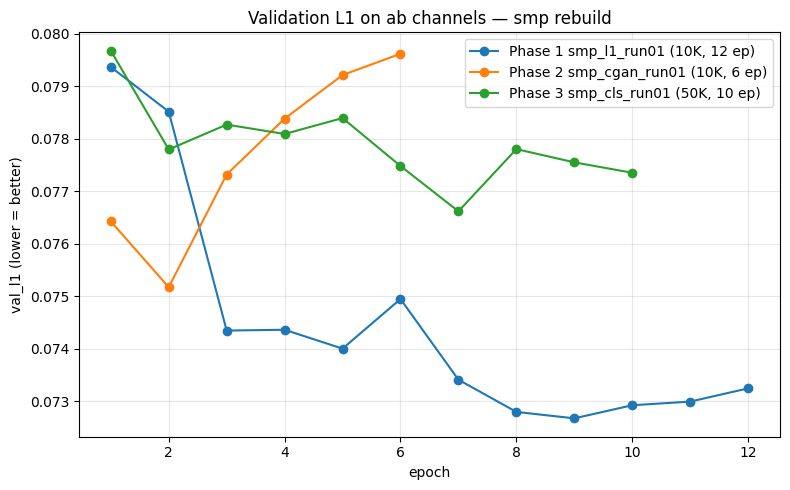

In [12]:
fig, ax = plt.subplots(figsize=(8, 5))
for name, df in logs.items():
    if df.empty:
        continue
    ax.plot(df["epoch"], df["val_l1"], marker="o", label=name)
ax.set_xlabel("epoch")
ax.set_ylabel("val_l1 (lower = better)")
ax.set_title("Validation L1 on ab channels — smp rebuild")
ax.grid(True, alpha=0.3)
ax.legend()
plt.tight_layout()
plt.show()

## 3. cGAN training dynamics

Watching the discriminator loss (`train_d`) and the generator's adversarial loss (`train_g_adv`).
For LSGAN, healthy training sits roughly around `train_d ≈ 0.25`. If `train_d → 0` the
discriminator is winning and `train_g_adv` will climb. This rebuild trains D every 2 batches
to avoid that collapse.

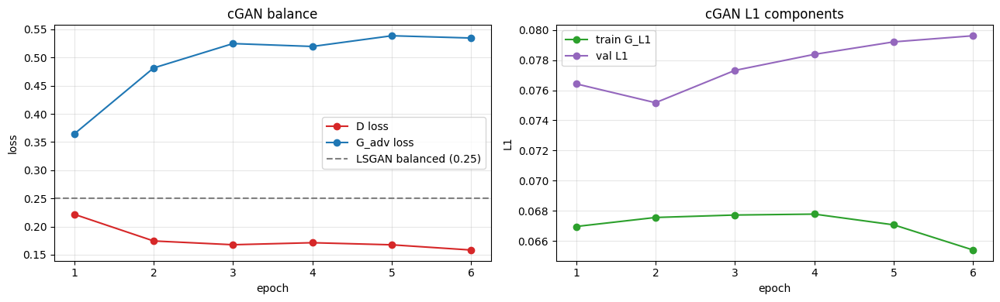

In [13]:
cgan_df = logs.get("Phase 2 smp_cgan_run01 (10K, 6 ep)", pd.DataFrame())
if not cgan_df.empty:
    fig, axes = plt.subplots(1, 2, figsize=(13, 4))
    axes[0].plot(cgan_df["epoch"], cgan_df["train_d"],     marker="o", color="tab:red",   label="D loss")
    axes[0].plot(cgan_df["epoch"], cgan_df["train_g_adv"], marker="o", color="tab:blue",  label="G_adv loss")
    axes[0].axhline(0.25, linestyle="--", color="gray", label="LSGAN balanced (0.25)")
    axes[0].set_xlabel("epoch"); axes[0].set_ylabel("loss"); axes[0].set_title("cGAN balance")
    axes[0].legend(); axes[0].grid(True, alpha=0.3)

    axes[1].plot(cgan_df["epoch"], cgan_df["train_g_l1"], marker="o", color="tab:green",  label="train G_L1")
    axes[1].plot(cgan_df["epoch"], cgan_df["val_l1"],     marker="o", color="tab:purple", label="val L1")
    axes[1].set_xlabel("epoch"); axes[1].set_ylabel("L1"); axes[1].set_title("cGAN L1 components")
    axes[1].legend(); axes[1].grid(True, alpha=0.3)
    plt.tight_layout(); plt.show()
else:
    print("No cGAN log available.")

## 4. Hasler-Süsstrunk colorfulness across epochs

The new chart that makes the sepia attractor numerical. `colorfulness_ratio = pred / truth`:
ratios near 1.0 mean the prediction matches ground-truth chroma; ratios well below 1.0 mean the
model is desaturating. Only Phase 3 logged this metric (it didn't exist when Phase 1/2 ran).

If Phase 3's ratio climbs from ~0.4 (where the legacy regression models sit) toward 0.85–1.0,
that's the saturation breakthrough surfaced as a number.

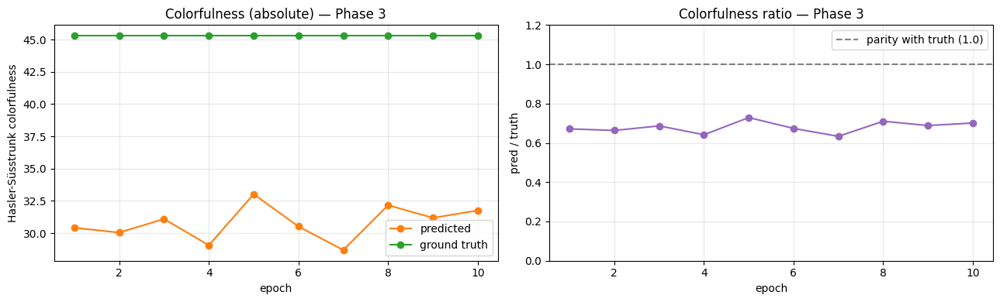

In [14]:
cls_df = logs.get("Phase 3 smp_cls_run01 (50K, 10 ep)", pd.DataFrame())
if not cls_df.empty and "colorfulness_ratio" in cls_df.columns:
    fig, axes = plt.subplots(1, 2, figsize=(13, 4))
    axes[0].plot(cls_df["epoch"], cls_df["val_colorfulness_pred"], marker="o", color="tab:orange", label="predicted")
    axes[0].plot(cls_df["epoch"], cls_df["val_colorfulness_true"], marker="o", color="tab:green",  label="ground truth")
    axes[0].set_xlabel("epoch"); axes[0].set_ylabel("Hasler-Süsstrunk colorfulness")
    axes[0].set_title("Colorfulness (absolute) — Phase 3")
    axes[0].legend(); axes[0].grid(True, alpha=0.3)

    axes[1].plot(cls_df["epoch"], cls_df["colorfulness_ratio"], marker="o", color="tab:purple")
    axes[1].axhline(1.0, linestyle="--", color="gray", label="parity with truth (1.0)")
    axes[1].set_xlabel("epoch"); axes[1].set_ylabel("pred / truth")
    axes[1].set_title("Colorfulness ratio — Phase 3")
    axes[1].legend(); axes[1].grid(True, alpha=0.3)
    axes[1].set_ylim(0, 1.2)
    plt.tight_layout(); plt.show()
else:
    print("Phase 3 colorfulness metric not available yet.")

## 5. Load all three models

In [15]:
def load_smp_regression(path: Path) -> SmpUNet:
    model = SmpUNet(freeze_encoder=True)
    state = torch.load(path, map_location=device, weights_only=False)
    if isinstance(state, dict):
        if "model_state_dict" in state:
            state = state["model_state_dict"]
        elif "generator_state_dict" in state:
            state = state["generator_state_dict"]
    model.load_state_dict(state)
    return model.to(device).eval()

def load_smp_classifier(path: Path):
    ckpt = torch.load(path, map_location=device, weights_only=False)
    num_classes = int(ckpt.get("num_classes", 214))
    trained_T = float(ckpt.get("temperature", 0.38))
    model = SmpUNetClassifier(num_classes=num_classes, freeze_encoder=True)
    model.load_state_dict(ckpt["model_state_dict"])
    return model.to(device).eval(), trained_T

phase_1_ckpt = PROJECT_ROOT / "checkpoints" / "smp_l1_run01"   / "best.pth"
phase_2_ckpt = PROJECT_ROOT / "checkpoints" / "smp_cgan_run01" / "best_generator.pth"
phase_3_ckpt = PROJECT_ROOT / "checkpoints" / "smp_cls_run01"  / "best.pth"

# Inference recipe for Phase 3 (T + bilateral from legacy cls_run01; ab_boost picked from
# the ablation in notebooks/06_smp_cls_showcase.ipynb section 8 — lands colorfulness at ~0.98):
PHASE_3_TEMPERATURE = 0.10
PHASE_3_BILATERAL = True
PHASE_3_BIL_D = 15
PHASE_3_BIL_SIGMA_COLOR = 25.0
PHASE_3_BIL_SIGMA_SPACE = 10.0
PHASE_3_AB_BOOST = 1.20

phase_1 = load_smp_regression(phase_1_ckpt)
phase_2 = load_smp_regression(phase_2_ckpt) if phase_2_ckpt.exists() else None
phase_3, bin_centers = None, None
if phase_3_ckpt.exists():
    phase_3, _trained_T = load_smp_classifier(phase_3_ckpt)
    bin_centers = torch.from_numpy(np.load(
        PROJECT_ROOT / "data" / "processed" / "ab_bin_centers.npy"
    )).to(torch.float32).to(device)
    print(f"loaded Phase 3 from {phase_3_ckpt.relative_to(PROJECT_ROOT)}  "
          f"T_train={_trained_T}  T_inference={PHASE_3_TEMPERATURE}  Q={bin_centers.shape[0]}")
else:
    print(f"Phase 3 checkpoint NOT FOUND at {phase_3_ckpt} — Phase 3 column will be skipped")
print(f"loaded Phase 1 from {phase_1_ckpt.relative_to(PROJECT_ROOT)}")
if phase_2 is not None:
    print(f"loaded Phase 2 from {phase_2_ckpt.relative_to(PROJECT_ROOT)}")
else:
    print(f"Phase 2 checkpoint NOT FOUND at {phase_2_ckpt} — Phase 2 column will be skipped")

loaded Phase 3 from checkpoints/smp_cls_run01/best.pth  T_train=0.38  T_inference=0.1  Q=214
loaded Phase 1 from checkpoints/smp_l1_run01/best.pth
loaded Phase 2 from checkpoints/smp_cgan_run01/best_generator.pth


## 6. Visual comparison on held-out validation images

Each row is one image. The columns are:

| Col 1 | Col 2 | Col 3 | Col 4 | Col 5 |
|---|---|---|---|---|
| **INPUT** (B&W) | **GENERATED — Phase 1** (smp L1) | **GENERATED — Phase 2** (smp + PatchGAN) | **GENERATED — Phase 3** (smp + Zhang cls, T=0.10 + bilateral) | **REAL** (ground truth) |

Phase 1 is the pure-L1 baseline; expect muted colors (the L1 desaturation failure mode).
Phase 2 adds adversarial pressure but, in practice, only nudges the sepia attractor — the
PatchGAN at λ=0.01 can't overpower an L1 anchor pulling toward the conditional mean.
Phase 3 swaps the regression head entirely for 214-way classification with rebalancing —
this is the recipe that breaks the attractor on the same dataset (proved earlier by the
legacy `cls_run01`).

In [16]:
val_ds = ColorizationDataset(split="val", horizontal_flip=False)
print(f"full val split: {len(val_ds)} images")

rng = np.random.default_rng(0)
N = 8
indices = sorted(rng.choice(len(val_ds), size=N, replace=False).tolist())
print(f"sampled indices: {indices}")

full val split: 9222 images
sampled indices: [152, 377, 693, 2486, 2837, 4711, 5870, 7838]


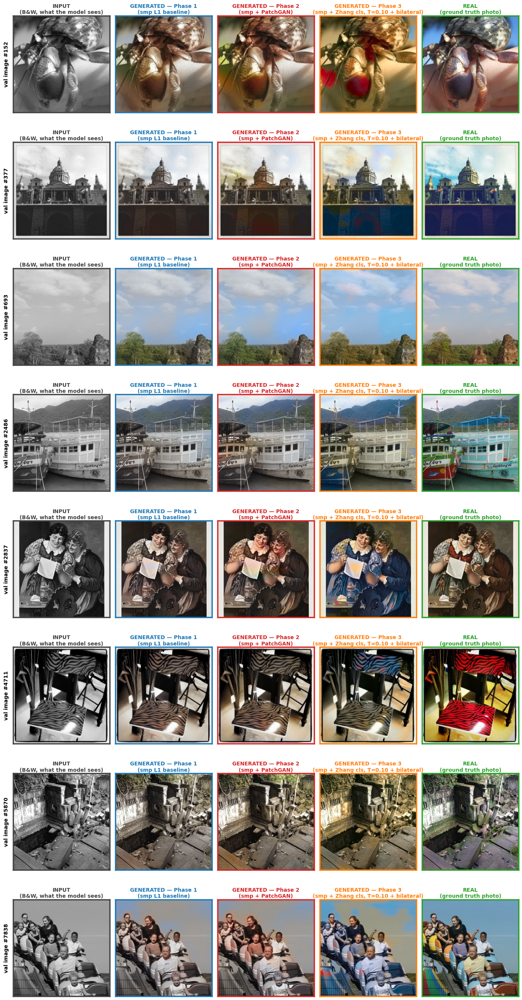

In [17]:
@torch.no_grad()
def predict_rgb_regression(model, l_tensor):
    l_in = l_tensor.unsqueeze(0).to(device)
    ab_pred = model(l_in).cpu().squeeze(0).clamp(-1, 1)
    return lab_to_rgb(l_tensor, ab_pred)

@torch.no_grad()
def predict_rgb_classifier(model, l_tensor, bin_centers, T,
                            bilateral=True, bil_d=15, bil_sc=25.0, bil_ss=10.0,
                            ab_boost=1.0):
    l_in = l_tensor.unsqueeze(0).to(device)
    logits = model(l_in)
    ab_lab = annealed_mean(logits, bin_centers, temperature=T)
    if bilateral:
        ab_lab = bilateral_smooth_ab(ab_lab, diameter=bil_d,
                                      sigma_color=bil_sc, sigma_space=bil_ss)
    ab_pred = (ab_lab / AB_MAX).cpu().squeeze(0)
    ab_pred = (ab_pred * ab_boost).clamp(-1, 1)
    return lab_to_rgb(l_tensor, ab_pred)

def gray_rgb(l_tensor):
    gray = ((l_tensor.squeeze(0) + 1.0) / 2.0 * 255.0).clamp(0, 255).numpy().astype(np.uint8)
    return np.stack([gray, gray, gray], axis=-1)

has_phase_2 = phase_2 is not None
has_phase_3 = phase_3 is not None
column_titles = [
    "INPUT\n(B&W, what the model sees)",
    "GENERATED — Phase 1\n(smp L1 baseline)",
]
column_colors = ["#444444", "#1f77b4"]
if has_phase_2:
    column_titles.append("GENERATED — Phase 2\n(smp + PatchGAN)")
    column_colors.append("#d62728")
if has_phase_3:
    column_titles.append("GENERATED — Phase 3\n(smp + Zhang cls, T=0.10 + bilateral)")
    column_colors.append("#ff7f0e")
column_titles.append("REAL\n(ground truth photo)")
column_colors.append("#2ca02c")

n_cols = len(column_titles)
fig, axes = plt.subplots(N, n_cols, figsize=(2.8 * n_cols, 3.4 * N))

for row, idx in enumerate(indices):
    l_tensor, ab_true = val_ds[idx]
    panels = [gray_rgb(l_tensor), predict_rgb_regression(phase_1, l_tensor)]
    if has_phase_2:
        panels.append(predict_rgb_regression(phase_2, l_tensor))
    if has_phase_3:
        panels.append(predict_rgb_classifier(
            phase_3, l_tensor, bin_centers, PHASE_3_TEMPERATURE,
            bilateral=PHASE_3_BILATERAL,
            bil_d=PHASE_3_BIL_D,
            bil_sc=PHASE_3_BIL_SIGMA_COLOR,
            bil_ss=PHASE_3_BIL_SIGMA_SPACE,
            ab_boost=PHASE_3_AB_BOOST,
        ))
    panels.append(lab_to_rgb(l_tensor, ab_true))

    for col, panel in enumerate(panels):
        ax = axes[row, col]
        ax.imshow(panel)
        ax.set_xticks([]); ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_edgecolor(column_colors[col])
            spine.set_linewidth(2.5)
        ax.set_title(column_titles[col], fontsize=10, weight="bold",
                     color=column_colors[col], pad=4)
    axes[row, 0].set_ylabel(f"val image #{idx}", rotation=90, fontsize=10,
                            weight="bold", labelpad=8)

plt.tight_layout()
plt.show()

## 7. Per-image L1 gap across phases

A lower L1 on a given image means the prediction is numerically closer to the ground truth's
ab channels. **L1 is anti-correlated with vividness past the desaturation floor** — Phase 3
may have *higher* L1 than Phase 1 yet look dramatically more vivid. That inversion is the
whole point of the Hasler-Süsstrunk metric above.

In [18]:
import torch.nn.functional as F

@torch.no_grad()
def l1_regression_for(model, l_tensor, ab_true):
    l_in = l_tensor.unsqueeze(0).to(device)
    ab_pred = model(l_in).cpu().squeeze(0).clamp(-1, 1)
    return F.l1_loss(ab_pred, ab_true).item()

@torch.no_grad()
def l1_classifier_for(model, l_tensor, ab_true, bin_centers, T,
                       bilateral=True, bil_d=15, bil_sc=25.0, bil_ss=10.0,
                       ab_boost=1.0):
    l_in = l_tensor.unsqueeze(0).to(device)
    ab_lab = annealed_mean(model(l_in), bin_centers, temperature=T)
    if bilateral:
        ab_lab = bilateral_smooth_ab(ab_lab, diameter=bil_d,
                                      sigma_color=bil_sc, sigma_space=bil_ss)
    ab_pred = (ab_lab / AB_MAX).cpu().squeeze(0)
    ab_pred = (ab_pred * ab_boost).clamp(-1, 1)
    return F.l1_loss(ab_pred, ab_true).item()

rows = []
for idx in indices:
    l_tensor, ab_true = val_ds[idx]
    l1_phase_1 = l1_regression_for(phase_1, l_tensor, ab_true)
    row = {"idx": idx, "phase_1_l1": l1_phase_1}
    if has_phase_2:
        l1_phase_2 = l1_regression_for(phase_2, l_tensor, ab_true)
        row["phase_2_l1"] = l1_phase_2
        row["delta_p2_minus_p1"] = l1_phase_2 - l1_phase_1
    if has_phase_3:
        l1_phase_3 = l1_classifier_for(
            phase_3, l_tensor, ab_true, bin_centers, PHASE_3_TEMPERATURE,
            bilateral=PHASE_3_BILATERAL,
            bil_d=PHASE_3_BIL_D,
            bil_sc=PHASE_3_BIL_SIGMA_COLOR,
            bil_ss=PHASE_3_BIL_SIGMA_SPACE,
            ab_boost=PHASE_3_AB_BOOST,
        )
        row["phase_3_l1"] = l1_phase_3
        row["delta_p3_minus_p1"] = l1_phase_3 - l1_phase_1
    rows.append(row)
sort_col = "delta_p3_minus_p1" if has_phase_3 else ("delta_p2_minus_p1" if has_phase_2 else "phase_1_l1")
delta_df = pd.DataFrame(rows).sort_values(sort_col)
delta_df

,idx,phase_1_l1,phase_2_l1,delta_p2_minus_p1,phase_3_l1,delta_p3_minus_p1
1,377,0.087566,0.096914,0.009348,0.078337,-0.009229
5,4711,0.122559,0.115254,-0.007305,0.126061,0.003502
3,2486,0.060469,0.063794,0.003325,0.074016,0.013548
7,7838,0.081576,0.089143,0.007567,0.097209,0.015633
2,693,0.037786,0.046745,0.008958,0.057155,0.019369
6,5870,0.037907,0.048082,0.010175,0.069856,0.031949
4,2837,0.037120,0.036174,-0.000946,0.073222,0.036102
0,152,0.075801,0.092167,0.016366,0.139207,0.063406


## 8. Pre-rendered training-time sample grids

Per-epoch grids saved during training (8 fixed images from the 500-image val subset that
`train_smp.py` used). Phase 3 grids were already rendered at T=0.10 + bilateral so the
saturation breakthrough is visible epoch-over-epoch.

| Col 1 | Col 2 | Col 3 |
|---|---|---|
| **INPUT** | **GENERATED** | **REAL** |

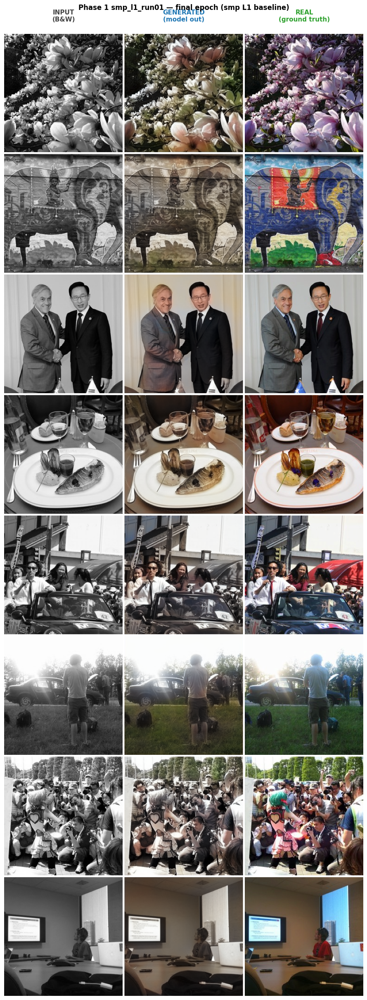

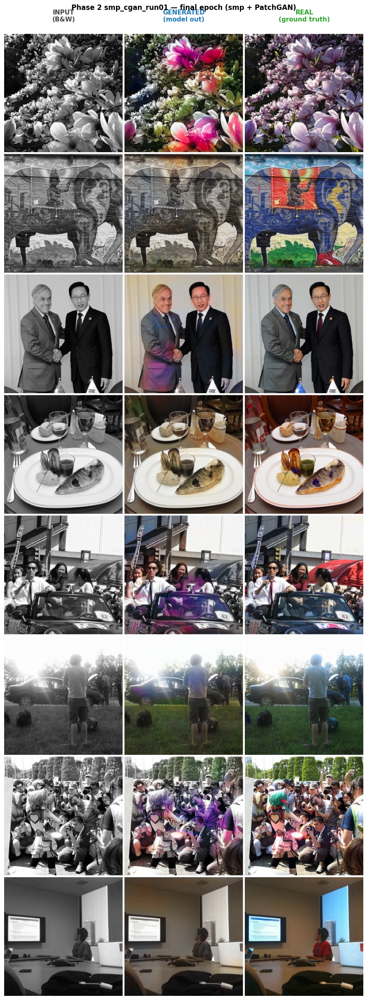

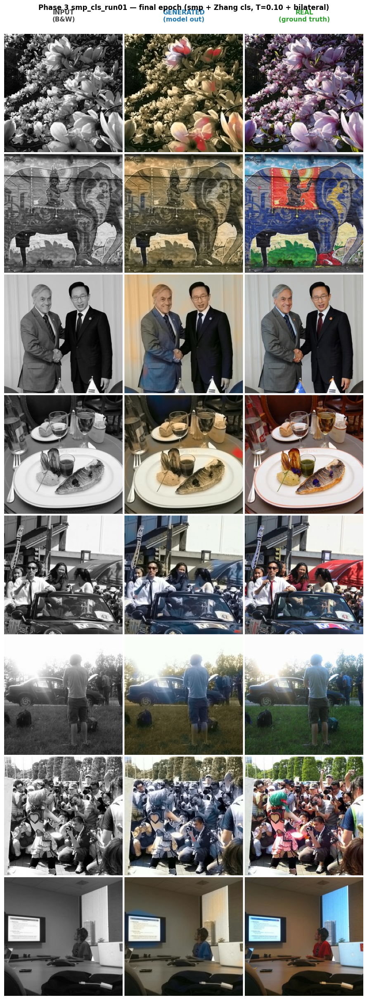

In [19]:
def show_grid_with_labels(path: Path, title: str) -> None:
    if not path.exists():
        print(f"=== {title}: NOT FOUND at {path} ===")
        return
    img = np.array(Image.open(path))
    h, w = img.shape[:2]
    col_w = (w - 8) / 3
    col_centers = [col_w / 2, col_w + 4 + col_w / 2, 2 * col_w + 8 + col_w / 2]
    labels = [
        ("INPUT\n(B&W)",            "#444444"),
        ("GENERATED\n(model out)",  "#1f77b4"),
        ("REAL\n(ground truth)",    "#2ca02c"),
    ]

    fig_h = 12 * h / w
    fig, ax = plt.subplots(figsize=(9, fig_h))
    ax.imshow(img)
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
    for cx, (lbl, color) in zip(col_centers, labels):
        ax.text(cx, -h * 0.012, lbl, ha="center", va="bottom",
                fontsize=11, weight="bold", color=color)
    ax.set_title(title, fontsize=12, weight="bold", pad=42)
    plt.tight_layout()
    plt.show()

sample_dirs = [
    ("Phase 1 smp_l1_run01 — final epoch (smp L1 baseline)",
        PROJECT_ROOT / "outputs" / "samples" / "smp_l1_run01"   / "epoch_012.png"),
    ("Phase 2 smp_cgan_run01 — final epoch (smp + PatchGAN)",
        PROJECT_ROOT / "outputs" / "samples" / "smp_cgan_run01" / "epoch_006.png"),
    ("Phase 3 smp_cls_run01 — final epoch (smp + Zhang cls, T=0.10 + bilateral)",
        PROJECT_ROOT / "outputs" / "samples" / "smp_cls_run01"  / "epoch_010.png"),
]
for label, path in sample_dirs:
    show_grid_with_labels(path, label)

## Notes

- `val_l1` is on the normalized ab channels (range `[-1, 1]`), so 0.08 corresponds to an
  average per-channel error of about 10 LAB units.
- The cGAN's *raw L1* sometimes ticks up while *visual saturation* improves — the adversarial
  signal trades a tiny bit of pixel-wise fidelity for more believable color distributions.
- Compared to the legacy `cgan_run01` (which collapsed D by epoch 4), this rebuild uses a
  smaller discriminator LR (`3e-5` vs `1e-4`) and updates D every 2 batches as a safety net.
- **Phase 3's val_l1 may be *higher* than Phase 1's**, yet visibly more vivid. This isn't a
  bug — it's the L1-mean-attractor inversion the upstream chat called out: the regression
  objective's minimum lives at the conditional mean (sepia), so beating Phase 1 on L1 means
  matching its desaturation. The `colorfulness_ratio` chart above is the metric that actually
  tracks what we care about.
- Phase 3's training-time T=0.38 is Zhang's default (the value used for the logged `val_l1`).
  Inference and the visible sample grids use T=0.10 + bilateral, the empirically-found
  saturation breakthrough point from the legacy `cls_run01`.